# TODO:



In [1]:
import numpy as np
import pandas as pd
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import TargetEncoder, OneHotEncoder
from sklearn.preprocessing import QuantileTransformer, PowerTransformer, MinMaxScaler, StandardScaler, RobustScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn import linear_model
from sklearn import metrics
import joblib
from skrub import TableReport

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import validation_curve, ValidationCurveDisplay
from category_encoders import CountEncoder
from category_encoders.hashing import HashingEncoder
from tqdm.auto import tqdm

import os, glob
import gc
import time
import ast

In [2]:
BASE = ".."
COMP_DATA_BASE = os.path.join(BASE, "data", "raw")
PREP_DATA_BASE = os.path.join(BASE, "data", "processed")
FIGURES_BASE = os.path.join(BASE, "figures")

TRAIN_PATH = os.path.join(COMP_DATA_BASE, "train.csv")
TRAIN_DEMO_PATH = os.path.join(COMP_DATA_BASE, "train_demographics.csv")
TEST_PATH = os.path.join(COMP_DATA_BASE, "test.csv")
TEST_DEMO_PATH = os.path.join(COMP_DATA_BASE, "test_demographics.csv")

features = list(pl.read_csv(TRAIN_PATH).select(pl.all().exclude("ID")).columns)
train_ds = pl.read_csv(TRAIN_PATH)
train_demo_ds = pl.read_csv(TRAIN_DEMO_PATH)

In [3]:
print(f"Test columns")
test_cols = list(pl.read_csv(TEST_PATH).columns)
id_cols = test_cols[:4]
acc_cols = [col  for col in test_cols if col.startswith("acc")]
rot_cols = [col  for col in test_cols if col.startswith("rot")]
thm_cols = [col  for col in test_cols if col.startswith("thm")]
tof_cols = [[col  for col in test_cols if col.startswith(f"tof_{i+1}")] for i in range(5)]
target_cols = [col for col in train_ds.columns if col not in test_cols]
tof_cols_all = [col for cl in tof_cols for col in cl]
features = acc_cols+rot_cols+thm_cols+tof_cols_all

print(f"id-cols: {id_cols}")
print(f"acc: {acc_cols}")
print(f"rot: {rot_cols}")
print(f"thm: {thm_cols}")
for i in range(5):
    print(f"tof_{i+1}: {tof_cols[i]}")
    
print(f"Extra train columns")
print(f"{target_cols}")
for col in target_cols:
    print(f"{col+':':15} {train_ds.select(col).unique().to_series().to_list()}")

Test columns
id-cols: ['row_id', 'sequence_id', 'sequence_counter', 'subject']
acc: ['acc_x', 'acc_y', 'acc_z']
rot: ['rot_w', 'rot_x', 'rot_y', 'rot_z']
thm: ['thm_1', 'thm_2', 'thm_3', 'thm_4', 'thm_5']
tof_1: ['tof_1_v0', 'tof_1_v1', 'tof_1_v2', 'tof_1_v3', 'tof_1_v4', 'tof_1_v5', 'tof_1_v6', 'tof_1_v7', 'tof_1_v8', 'tof_1_v9', 'tof_1_v10', 'tof_1_v11', 'tof_1_v12', 'tof_1_v13', 'tof_1_v14', 'tof_1_v15', 'tof_1_v16', 'tof_1_v17', 'tof_1_v18', 'tof_1_v19', 'tof_1_v20', 'tof_1_v21', 'tof_1_v22', 'tof_1_v23', 'tof_1_v24', 'tof_1_v25', 'tof_1_v26', 'tof_1_v27', 'tof_1_v28', 'tof_1_v29', 'tof_1_v30', 'tof_1_v31', 'tof_1_v32', 'tof_1_v33', 'tof_1_v34', 'tof_1_v35', 'tof_1_v36', 'tof_1_v37', 'tof_1_v38', 'tof_1_v39', 'tof_1_v40', 'tof_1_v41', 'tof_1_v42', 'tof_1_v43', 'tof_1_v44', 'tof_1_v45', 'tof_1_v46', 'tof_1_v47', 'tof_1_v48', 'tof_1_v49', 'tof_1_v50', 'tof_1_v51', 'tof_1_v52', 'tof_1_v53', 'tof_1_v54', 'tof_1_v55', 'tof_1_v56', 'tof_1_v57', 'tof_1_v58', 'tof_1_v59', 'tof_1_v60', 'tof

# Preprocessing

In [12]:
group_size = 100
(train_ds
 .filter(pl.col("sequence_id").is_in(["SEQ_000007", "SEQ_000008"]))
 .sort(by="row_id", descending=True)
 .group_by("sequence_id", maintain_order=True)
 .tail(group_size)
 .group_by("sequence_id", maintain_order=True)
 .agg(pl.all().append(pl.repeat(None, group_size - pl.len().cast(int))))
 .explode(pl.exclude("sequence_id"))
 .with_columns(pl.all().reverse().over("sequence_id"))
 )

sequence_id,row_id,sequence_type,sequence_counter,subject,orientation,behavior,phase,gesture,acc_x,acc_y,acc_z,rot_w,rot_x,rot_y,rot_z,thm_1,thm_2,thm_3,thm_4,thm_5,tof_1_v0,tof_1_v1,tof_1_v2,tof_1_v3,tof_1_v4,tof_1_v5,tof_1_v6,tof_1_v7,tof_1_v8,tof_1_v9,tof_1_v10,tof_1_v11,tof_1_v12,tof_1_v13,tof_1_v14,tof_1_v15,…,tof_5_v27,tof_5_v28,tof_5_v29,tof_5_v30,tof_5_v31,tof_5_v32,tof_5_v33,tof_5_v34,tof_5_v35,tof_5_v36,tof_5_v37,tof_5_v38,tof_5_v39,tof_5_v40,tof_5_v41,tof_5_v42,tof_5_v43,tof_5_v44,tof_5_v45,tof_5_v46,tof_5_v47,tof_5_v48,tof_5_v49,tof_5_v50,tof_5_v51,tof_5_v52,tof_5_v53,tof_5_v54,tof_5_v55,tof_5_v56,tof_5_v57,tof_5_v58,tof_5_v59,tof_5_v60,tof_5_v61,tof_5_v62,tof_5_v63
str,str,str,i64,str,str,str,str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""SEQ_000008""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""SEQ_000008""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""SEQ_000008""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""SEQ_000008""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""SEQ_000008""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""SEQ_000007""","""SEQ_000007_000052""","""Target""",52,"""SUBJ_059520""","""Seated Lean Non Dom - FACE DOW…","""Performs gesture""","""Gesture""","""Cheek - pinch skin""",6.140625,5.488281,5.1953125,0.258118,-0.230469,-0.401001,-0.848206,28.95178,31.481295,29.328842,29.346125,27.72184,82.0,73.0,47.0,43.0,36.0,32.0,34.0,36.0,-1.0,67.0,54.0,43.0,43.0,40.0,34.0,35.0,…,130.0,-1.0,-1.0,-1.0,-1.0,108.0,111.0,117.0,133.0,-1.0,-1.0,-1.0,-1.0,101.0,108.0,117.0,130.0,-1.0,-1.0,-1.0,-1.0,105.0,114.0,127.0,-1.0,-1.0,-1.0,-1.0,-1.0,104.0,113.0,121.0,-1.0,-1.0,111.0,101.0,93.0
"""SEQ_000007""","""SEQ_000007_000053""","""Target""",53,"""SUBJ_059520""","""Seated Lean Non Dom - FACE DOW…","""Performs gesture""","""Gesture""","""Cheek - pinch skin""",6.144531,5.6015625,5.84375,0.232361,-0.278015,-0.426758,-0.828613,29.033009,31.303263,29.316809,29.13199,27.725689,77.0,65.0,43.0,39.0,34.0,32.0,35.0,38.0,-1.0,62.0,46.0,45.0,41.0,38.0,32.0,36.0,…,-1.

In [148]:
imu_only_sequences = train_ds.filter(pl.all_horizontal(pl.col(tof_cols_all + thm_cols).is_null()))

# Check if sequences with no tof and thm columns in steps are missing those columns in all step -> yes
imu_only_sequences_agg = imu_only_sequences.group_by("sequence_id").agg(pl.col("row_id").len())
tmp = train_ds.filter(pl.col("sequence_id").is_in(imu_only_sequences.select("sequence_id").to_series().implode())).group_by("sequence_id").agg(pl.col("row_id").len())
imu_only_sequences_agg.join(tmp, on="sequence_id").filter(pl.col("row_id") != pl.col("row_id_right"))

imu_only_sequences_agg.select("sequence_id").unique()

sequence_id
str
"""SEQ_001905"""
"""SEQ_044004"""
"""SEQ_003071"""
"""SEQ_057193"""
"""SEQ_048861"""
…
"""SEQ_053884"""
"""SEQ_012168"""
"""SEQ_012619"""


In [4]:
# Missing values
# Remove sequences without thm and tof
no_nans = train_ds.drop_nulls()
with_nans = train_ds.join(no_nans, on=["subject", "sequence_id", "row_id"], how='anti')
n_nulls = with_nans.with_columns(pl.sum_horizontal(pl.all().is_null()).alias("Nulls")).sort(by="Nulls")
sequences1 = n_nulls.filter(pl.col("Nulls") == 325).select(["sequence_id"]).unique().to_series().implode()
missing_thm_tof_seqs = train_ds.filter(pl.col("sequence_id").is_in(sequences1) )

# Some sequences with thm_5 and all tof_5, and some sequences with thm_1, thm_5 and all tof_5 missing for whole sequence
# impute with 0
sequences2 = n_nulls.filter((pl.col("Nulls") == 65) | (pl.col("Nulls") == 66)).select(["sequence_id"]).unique().to_series().implode()
impute_seqs = (train_ds
               .filter(pl.col("sequence_id").is_in(sequences2))
               .with_columns(pl.all().fill_null(0)))

# Some sequences with rot missing
# impute with null or omit?
sequences4 = n_nulls.filter((pl.col("Nulls") == 4) ).select(["sequence_id"]).unique().to_series().implode()
rot_fill_seqs = (train_ds
               .filter(pl.col("sequence_id").is_in(sequences4))
               .with_columns(pl.all().fill_null(0)))


# Some sequences with single rot or thm values missing
# backfill/forwardfill if possible
sequences3 = n_nulls.filter((pl.col("Nulls") == 1)).select(["sequence_id"]).unique().to_series().implode()
backfill_seqs = (train_ds
               .filter(pl.col("sequence_id").is_in(sequences3))
               .with_columns(pl.all().fill_null(strategy="forward").over("sequence_id"))
               .with_columns(pl.all().fill_null(strategy="backward").over("sequence_id"))
               .with_columns(pl.all().fill_null(0)))

other_seqs = train_ds.filter(~pl.col("sequence_id").is_in(sequences1) & 
                             ~pl.col("sequence_id").is_in(sequences2) & 
                             ~pl.col("sequence_id").is_in(sequences3) & 
                             ~pl.col("sequence_id").is_in(sequences4))

# missing_thm_tof_seqs are omitted
# Remove sequence with missing Gesture phase
train_ds_prep = (pl.concat([other_seqs, impute_seqs, rot_fill_seqs, backfill_seqs], how="vertical").sort(by="row_id")
                 .filter(pl.col("sequence_id") != 'SEQ_011975'))

assert len(train_ds_prep.select("row_id").unique()) == len(train_ds_prep), "Duplicate rows!"
assert train_ds_prep.null_count().sum_horizontal().item() == 0, "Missing_values!"

In [29]:
# Fast preprocess


# need to check for sequences without thm and tof
def preprocess(data):
    return (data
            .sort(by="row_id")
            .with_columns(pl.all().fill_null(strategy="forward").over("sequence_id"))
            .with_columns(pl.all().fill_null(strategy="backward").over("sequence_id"))
            .with_columns(pl.col(tof_cols_all).fill_null(-1)) 
            .with_columns(pl.col(thm_cols).fill_null(strategy="mean").over("sequence_id"))
            .with_columns(pl.all().fill_null(0))
            
            .filter(pl.col("sequence_id") != 'SEQ_011975')
            )
train_ds_prep_fast = preprocess(train_ds)

In [11]:
my_tablereport = TableReport(train_ds_prep.select(features))
display(my_tablereport)

Processing column 332 / 332


<TableReport: use .open() to display>

In [30]:
my_tablereport = TableReport(train_ds_prep_fast.select(features))
display(my_tablereport)

Processing column 332 / 332


<TableReport: use .open() to display>

# Splitting

In [13]:
from sklearn.model_selection import StratifiedGroupKFold

<Axes: xlabel='gesture'>

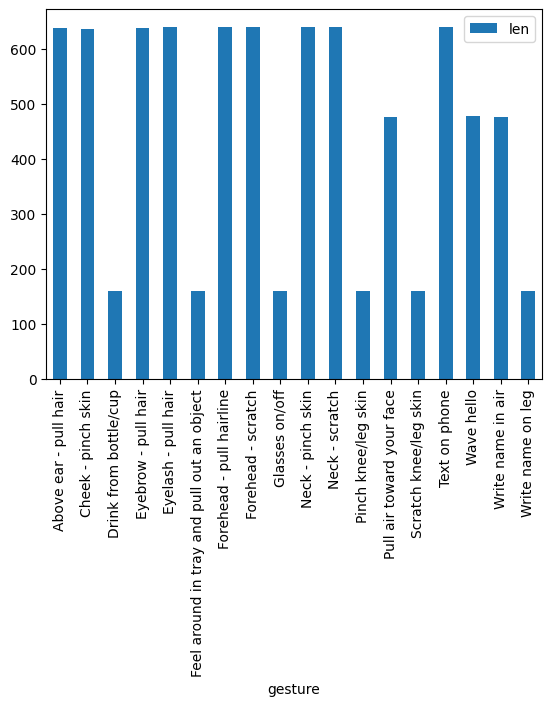

In [14]:
sequences = (train_ds
             .group_by(["sequence_id", "subject"])
             .agg(pl.col("gesture").first())
            )
             
sequences.group_by("gesture").len().sort(by="gesture").to_pandas().plot(kind="bar", x="gesture", y="len")

In [ ]:
sgkf = StratifiedGroupKFold(n_splits=4, shuffle=True, random_state=42)
sgkf2 = StratifiedGroupKFold(n_splits=2, shuffle=True, random_state=42)
train_index, test_index = next(sgkf.split(sequences, 
                                            sequences.select("gesture").to_series(), 
                                            sequences.select("subject").to_series() ))
train_index2, test_index2 = next(sgkf2.split(sequences[test_index], 
                                        sequences[test_index].select("gesture").to_series(), 
                                        sequences[test_index].select("subject").to_series() ))
print(f"{'Train':6} proportion {len(train_index)/(len(test_index) + len(train_index)):.1%} count {len(train_index)}" )
print(f"{'Val':6} proportion {len(train_index2)/(len(test_index) + len(train_index)):.1%} count {len(train_index2)}" )
print(f"{'Test':6} proportion {len(test_index2)/(len(test_index) + len(train_index)):.1%} count {len(test_index2)}" )
# val and test sequences: sequences[test_index][X] with X in (train_index2, test_index2)

Train  proportion 75.6% count 6159
Val    proportion 12.5% count 1020
Test   proportion 11.9% count 972


In [136]:
train_ds.group_by("sequence_id").agg(pl.col("gesture").last())

sequence_id,gesture
str,str
"""SEQ_042115""","""Eyebrow - pull hair"""
"""SEQ_042460""","""Pull air toward your face"""
"""SEQ_011131""","""Neck - pinch skin"""
"""SEQ_046888""","""Eyebrow - pull hair"""
"""SEQ_022791""","""Neck - scratch"""
…,…
"""SEQ_020720""","""Write name in air"""
"""SEQ_028419""","""Above ear - pull hair"""
"""SEQ_034465""","""Cheek - pinch skin"""


In [131]:
train_demo_ds.filter(pl.col("subject").is_in(train_ds[test_index].select("subject").to_series().implode()))

subject,adult_child,age,sex,handedness,height_cm,shoulder_to_wrist_cm,elbow_to_wrist_cm
str,i64,i64,i64,i64,f64,i64,f64
"""SUBJ_000206""",1,41,1,1,172.0,50,25.0
"""SUBJ_001430""",0,11,0,1,167.0,51,27.0
"""SUBJ_003328""",1,33,1,1,171.0,52,25.0
"""SUBJ_004117""",0,15,0,1,184.0,54,28.0
"""SUBJ_008304""",0,16,1,1,154.0,45,22.0
…,…,…,…,…,…,…,…
"""SUBJ_059520""",0,12,1,1,163.0,52,24.0
"""SUBJ_061552""",0,11,0,0,148.0,43,25.0
"""SUBJ_063346""",1,42,1,1,183.0,51,26.0


Fold 0:
Train  proportion 75.6% count 6159
Val    proportion 12.5% count 1020
Test   proportion 11.9% count 972


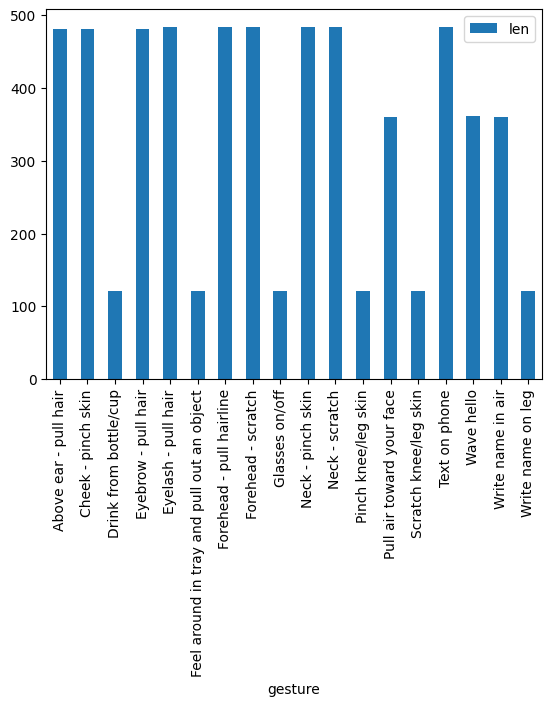

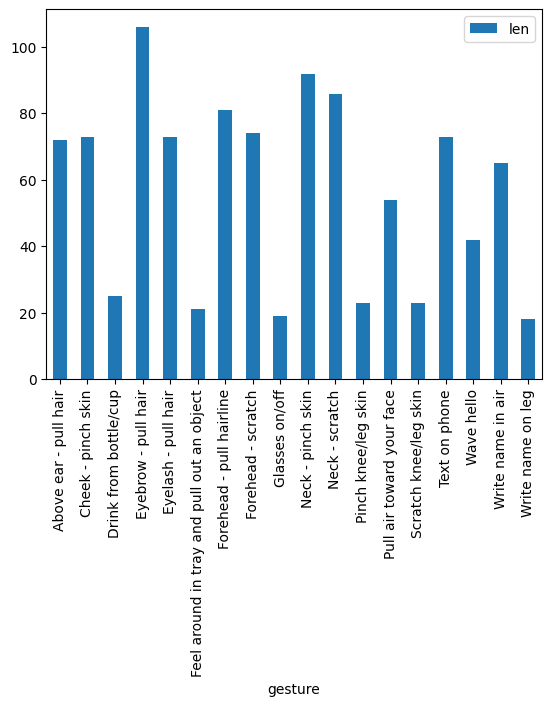

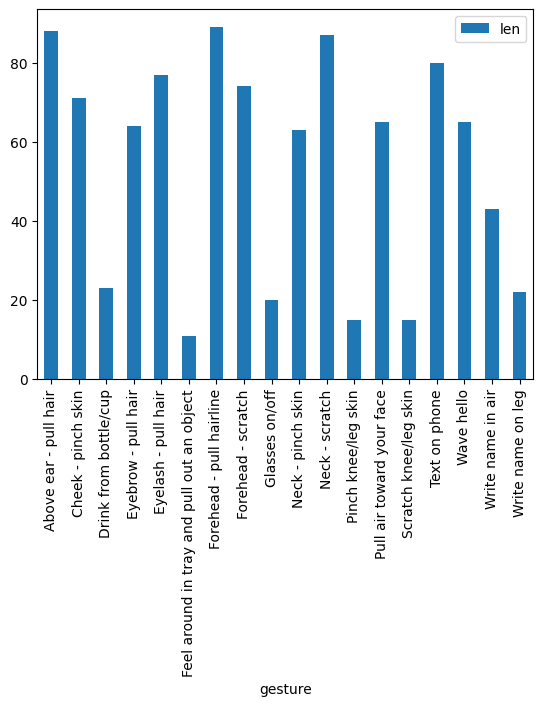

In [121]:
sgkf = StratifiedGroupKFold(n_splits=4, shuffle=True, random_state=42)
for i, (train_index, test_index) in enumerate(sgkf.split(sequences, 
                                            sequences.select("gesture").to_series(), 
                                            sequences.select("subject").to_series() )):
    print(f"Fold {i}:")
    sgkf2 = StratifiedGroupKFold(n_splits=2, shuffle=True, random_state=42)
    for train_index2, test_index2 in sgkf2.split(sequences[test_index], 
                                            sequences[test_index].select("gesture").to_series(), 
                                            sequences[test_index].select("subject").to_series() ):
        print(f"{'Train':6} proportion {len(train_index)/(len(test_index) + len(train_index)):.1%} count {len(train_index)}" )
        print(f"{'Val':6} proportion {len(train_index2)/(len(test_index) + len(train_index)):.1%} count {len(train_index2)}" )
        print(f"{'Test':6} proportion {len(test_index2)/(len(test_index) + len(train_index)):.1%} count {len(test_index2)}" )
        sequences[train_index].group_by("gesture").len().sort(by="gesture").to_pandas().plot(kind="bar", x="gesture", y="len")
        sequences[train_index2].group_by("gesture").len().sort(by="gesture").to_pandas().plot(kind="bar", x="gesture", y="len")
        sequences[test_index2].group_by("gesture").len().sort(by="gesture").to_pandas().plot(kind="bar", x="gesture", y="len")
        break
    break


In [65]:
X = np.ones((17, 2))
y = np.array([0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0])
groups = np.array([1, 1, 2, 2, 3, 3, 3, 4, 5, 5, 5, 5, 6, 6, 7, 8, 8])
sgkf = StratifiedGroupKFold(n_splits=3)
sgkf.get_n_splits(X, y)

for i, (train_index, test_index) in enumerate(sgkf.split(X, y, groups)):
    print(f"Fold {i}:")
    print(f"  Train: index={train_index}")
    print(f"         group={groups[train_index]}")
    print(f"  Test:  index={test_index}")
    print(f"         group={groups[test_index]}")

Fold 0:
  Train: index=[ 0  1  2  3  7  8  9 10 11 15 16]
         group=[1 1 2 2 4 5 5 5 5 8 8]
  Test:  index=[ 4  5  6 12 13 14]
         group=[3 3 3 6 6 7]
Fold 1:
  Train: index=[ 4  5  6  7  8  9 10 11 12 13 14]
         group=[3 3 3 4 5 5 5 5 6 6 7]
  Test:  index=[ 0  1  2  3 15 16]
         group=[1 1 2 2 8 8]
Fold 2:
  Train: index=[ 0  1  2  3  4  5  6 12 13 14 15 16]
         group=[1 1 2 2 3 3 3 6 6 7 8 8]
  Test:  index=[ 7  8  9 10 11]
         group=[4 5 5 5 5]
